## Aufgabe 0: Datenanalyse

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import gurobipy as gp
from gurobipy import GRB
from datetime import timedelta

In [2]:
df = pd.read_pickle("energy_2020.pkl")
df

,Datum (MEZ),Solar [kWh],Preis [EUR/kWh],Last [kWh]
0,2020-01-01 00:00:00+01:00,0.0,0.20940,94.2636
1,2020-01-01 01:00:00+01:00,0.0,0.19300,92.4732
2,2020-01-01 02:00:00+01:00,0.0,0.18275,90.2108
3,2020-01-01 03:00:00+01:00,0.0,0.16160,87.5294
4,2020-01-01 04:00:00+01:00,0.0,0.15425,86.8490
...,...,...,...,...
8779,2020-12-31 19:00:00+01:00,0.0,0.29735,120.8536
8780,2020-12-31 20:00:00+01:00,0.0,0.28350,112.4558
8781,2020-12-31 21:00:00+01:00,0.0,0.26220,106.1954
8782,2020-12-31 22:00:00+01:00,0.0,0.25930,103.6396


### 0.1

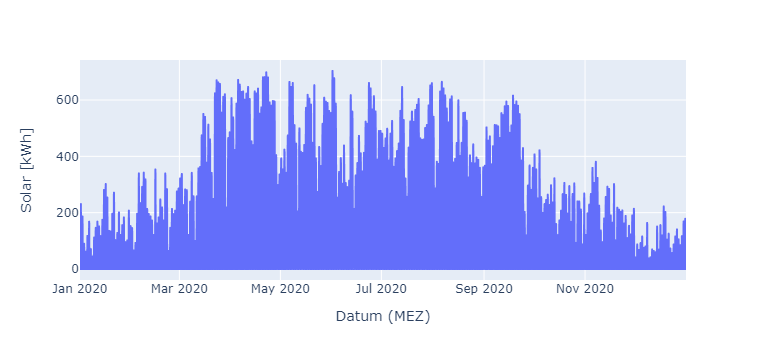

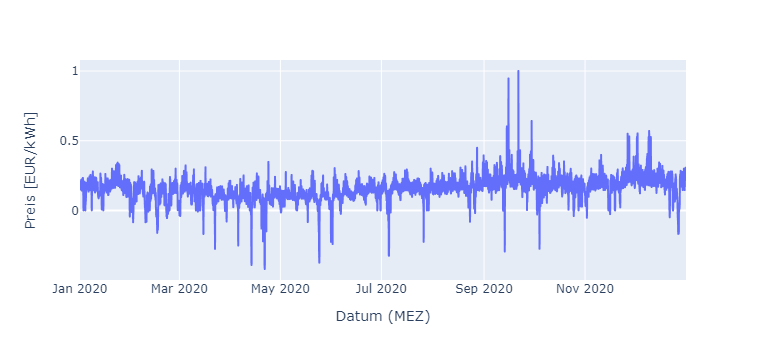

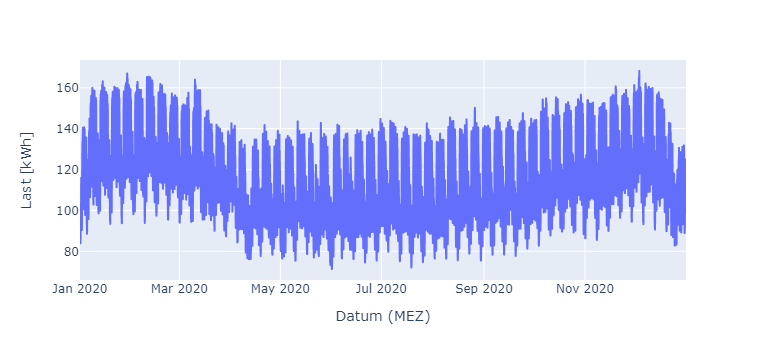

In [3]:
cols = ["Solar [kWh]","Preis [EUR/kWh]","Last [kWh]"]

for feature in cols:
    fig = px.line(df, x="Datum (MEZ)", y=feature)
    fig.show()

### 0.2

In [4]:
df["Datum (MEZ)"] = pd.to_datetime(df["Datum (MEZ)"])
df.groupby(df["Datum (MEZ)"].map(lambda x: x.year)).agg(
    {"Last [kWh]" : "sum"}
).rename(columns={"Last [kWh]": "Gesamtverbrauch [kWh]"})

,Gesamtverbrauch [kWh]
Datum (MEZ),
2020,1.043806e+06


### 0.3

In [5]:
df_kosten = df.groupby(df["Datum (MEZ)"].map(lambda x: x.year)).agg({"Last [kWh]" : "sum"})
df_kosten["Gesamtkosten in EUR"] = df_kosten["Last [kWh]"] * 0.22
df_kosten

,Last [kWh],Gesamtkosten in EUR
Datum (MEZ),,
2020,1.043806e+06,229637.244408


### 0.4

In [6]:
df.groupby(df["Datum (MEZ)"].map(lambda x: x.year)).agg(
    {"Solar [kWh]" : "sum"}).rename(columns={"Solar [kWh]": "Gesamt Strommenge PV-Anlage [kWh]"})

,Gesamt Strommenge PV-Anlage [kWh]
Datum (MEZ),
2020,970692.484


### 0.5

In [7]:
df.groupby(df["Datum (MEZ)"].map(lambda x: x.year)).agg(
    {"Preis [EUR/kWh]" : "mean"}).rename(columns={"Preis [EUR/kWh]": "Durch. Strompreis [kWh]"})

,Durch. Strompreis [kWh]
Datum (MEZ),
2020,0.152354


In [8]:
df["Stromdiff"] = df["Last [kWh]"] - df["Solar [kWh]"]
df["Stromdiff"].sum()

73113.17239999997

$\text{Battlst}_{t}\in \mathbb{N}^+$: Ladestand der Batterie zum Zeitpunkt t in kWh.

## Aufgabe 1: Basismodell

<div>
<img src="Aufgabe1.png" width="750"/>
</div>

### Indexmengen
$t \in T $: Index für den Zeithorizont



### Parameter
$Last_{t}\in \mathbb{R}^+$: Strombedarf zum Zeitpunkt t in kWh.

$PV_{t}\in \mathbb{R}^+$: Produzierte Strommenge der PV-Anlage zum Zeitpunkt t.

$Stromkosten_{t} = 22ct/kWh$: Strompreis zum Zeitpunkt t.

$Einspg_{t} = 4ct/kWh$: Gewinn für einspeisen des Stroms zum Zeitpunkt t.

$\text{Battlst}_{0} = 0kWh $: Anfangskapazität der Batterie beträgt 0kWh.

$\text{BattKap}_{max} = 100 kWh$: Maximale Speicherkapazität der Batterie zum Zeitpunkt t.

$\text{BattKap}_{min} = 0 kWh$: Minimale Speicherkapazität der Batterie zum Zeitpunkt t.

$\text{Batteff} = 0.9$: Die Batterie hat eine Energieeffizienz von 90%.





### Entscheidungsvariablen

${eigverb}_{t} \in \mathbb{R}^+$: Eigenverbrauch zum Zeitpunkt t in kWh.

${strein}_{t} \in \mathbb{R}^+$: Strommenge die ins Netz eingepseist wird zum Zeitpunkt t.

${strziehn}_{t} \in \mathbb{R}^+$: Strommenge die vom Netz bezogen wird zum Zeitpunkt t.

${battlst}_{t} \in \{0,...,100\}kWh+$: Batteriezustand zum Zeitpunkt t.

${battentladen}_{t} \in \{0,...,50\}kWh$: Entladung der Batterie zum Zeitpunkt t in kWh.

${battladen}_{t} \in \{0,...,50\}kWh$: Beladung der Batterie zum Zeitpunkt t in kWh.





### Zielfunktion

- **Gesamtkosten minimieren**.

\begin{equation}
\text{Min} \quad \sum_{t \in T} (strziehn_{t} * stromkosten) - (strein_{t} * einspg)  
\end{equation}


### Nebenbedingungen

**Eigenverbrauch**: Eigenverbrauch zum Zeitpunkt t.
\begin{equation}
\text eigverb_{t} + strein_{t} + battladen_t{t} = pv_{t} \quad \forall t \in T
\tag{1}
\end{equation}


**Strombedarf**: Der Strombedarf muss zu jedem Zeitpunkt t zu 100% gedeckt werden.
\begin{equation}
\text eigverb_{t} + battentladen_{t} + stromziehn_{t} = Last_{t} \quad \forall t \in T
\tag{2}
\end{equation}


**Batterie be/entladen**: Die Summe der Lastströme der Batterie darf nicht größer als 50kWh sein.
\begin{equation}
\text battentladen_{t} + battladen_{t} \leq 50kWh \quad \forall t \in T
\tag{3}
\end{equation}

**Batteriestatus**: Batteriezustand muss diese Bedinung erfüllen, um laden bzw. entladen zu können.
\begin{equation}
\text  0 \leq Battlst_{t} \leq 100 \quad \forall t \in T
\tag{4}
\end{equation}

**Batteriezustand t=0**: Batteriezustand zum Zeitpunkt 0 beträgt 0kWh.
\begin{equation}
\text  Battlst_{0} = 0 \quad t = 0
\tag{5}
\end{equation}


**Batteriezustand t**: Batteriezustand zum Zeitpunkt t.
\begin{equation}
\text  battlst{t} + batteff * (battladen{t} - battentladen{t} = Battlst_{t+1} \quad \forall t \in T
\tag{6}
\end{equation}

#### Input Data

In [9]:
m1 = gp.Model('Basismodell')

Set parameter Username
Academic license - for non-commercial use only - expires 2024-05-15


In [10]:
# Paramter
stromkosten = 0.22
einspg = 0.04
battKapmax = 100
battKapmin = 0
batteff = 0.9

last = df["Last [kWh]"].values # Strombedarf zum Zeitpunkt t.
pv = df["Solar [kWh]"].values # Produzierte Strommenge der PV-Anlage zum Zeitpunkt t.
zeit = range(0,8784) # Zeithorizont

# Entscheidungsvariablen
strein_t = m1.addVars(zeit, vtype=GRB.CONTINUOUS, name="Strom einspeisen", lb=0)
strziehn_t = m1.addVars(zeit, vtype=GRB.CONTINUOUS, name="Strom ziehen", lb=0)
battlst_t = m1.addVars(range(0,8785), vtype=GRB.CONTINUOUS, name = "Ladestand Batterie")
battentladen_t = m1.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie entladen", lb=0)
battladen_t = m1.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie laden", lb=0)
eigverb_t = m1.addVars(zeit, vtype=GRB.CONTINUOUS, name="Eigenverbrauch", lb=0)

# Nebenbedingungen
# Standort muss zu 100% versorgt werden
last_const = m1.addConstrs(eigverb_t[t] + strziehn_t[t] + (batteff*battentladen_t[t]) == last[t]
                          for t in zeit)

# Eigenverbrauch zum Zeitpunkt t

eigenverb_const = m1.addConstrs(eigverb_t[t] + strein_t[t] + battladen_t[t] == pv[t] 
                               for t in zeit)

# Batteriezustand zum Zeitpunkt 0 beträgt 0kWh
battzustand_const = m1.addConstr(battlst_t[zeit[0]] == battKapmin)

# Batterieladestand darf nicht kleiner als 0kWh sein
battkapmin_const = m1.addConstrs(battlst_t[t] >= battKapmin
                                for t in zeit)

# Maximaler Batterieladestand darf nicht größer 100kWh sein
battkapmax_const = m1.addConstrs(battlst_t[t] <= battKapmax
                                for t in zeit)

# Batteriezustand zum Zeitpunkt t 
battlst_t_const = m1.addConstrs(battlst_t[t] + batteff * (battladen_t[t] - battentladen_t[t]) == battlst_t[t+1] 
                               for t in zeit)


# Die Batterie  darf nur mit max 50kWh be bzw. entladen
battbe_entladen_const = m1.addConstrs(batteff * (battentladen_t[t] + battladen_t[t]) <= 50
                                     for t in zeit)

# Zielfunktion
m1.setObjective(
    gp.quicksum(((strziehn_t[t] * stromkosten) - (strein_t[t] * einspg) for t in zeit)
                
                
        
    ), GRB.MINIMIZE
)


m1.optimize()

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: AMD Ryzen 3 3250U with Radeon Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 52705 rows, 52705 columns and 122977 nonzeros
Model fingerprint: 0x9818c2c5
Coefficient statistics:
  Matrix range     [9e-01, 1e+00]
  Objective range  [4e-02, 2e-01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-03, 7e+02]
Presolve removed 36418 rows and 30083 columns
Presolve time: 0.13s
Presolved: 16287 rows, 22622 columns, 44847 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.01s

Barrier statistics:
 AA' NZ     : 2.319e+04
 Factor NZ  : 1.645e+05 (roughly 17 MB of memory)
 Factor Ops : 2.507e+06 (less than 1 second per iteration)
 Threads    : 1

                  Objective                Residual
Iter       Primal          Dual         Primal    Dual     Compl     Time
   0  

In [11]:
dfm1 = pd.DataFrame()
for v in m1.getVars():
        name = v.varName
        zeit = int(v.varName[v.varName.index('[') + 1:v.varName.index(']')])
        if 'Strom einspeisen' in name:
            dfm1.loc[zeit, 'Strom einspeisen'] = v.x
        elif 'Strom ziehen' in name:
            dfm1.loc[zeit, 'Strom ziehen'] = v.x
        elif 'Ladestand Batterie' in name:
            dfm1.loc[zeit, 'Ladestand Batterie'] = v.X
        elif 'Batterie entladen' in name:
            dfm1.loc[zeit, 'Batterie entladen'] = v.x
        elif 'Batterie laden' in name:
            dfm1.loc[zeit, 'Batterie laden'] = v.x
        elif 'Eigenverbrauch' in name:
            dfm1.loc[zeit, 'Eigenverbrauch'] = v.x

In [12]:
dfm1

,Strom einspeisen,Strom ziehen,Ladestand Batterie,Batterie entladen,Batterie laden,Eigenverbrauch
0,0.0,94.2636,0.0,0.0,0.0,0.0
1,0.0,92.4732,0.0,0.0,0.0,0.0
2,0.0,90.2108,0.0,0.0,0.0,0.0
3,0.0,87.5294,0.0,0.0,0.0,0.0
4,0.0,86.8490,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
8780,0.0,112.4558,0.0,0.0,0.0,0.0
8781,0.0,106.1954,0.0,0.0,0.0,0.0
8782,0.0,103.6396,0.0,0.0,0.0,0.0
8783,0.0,98.7446,0.0,0.0,0.0,0.0


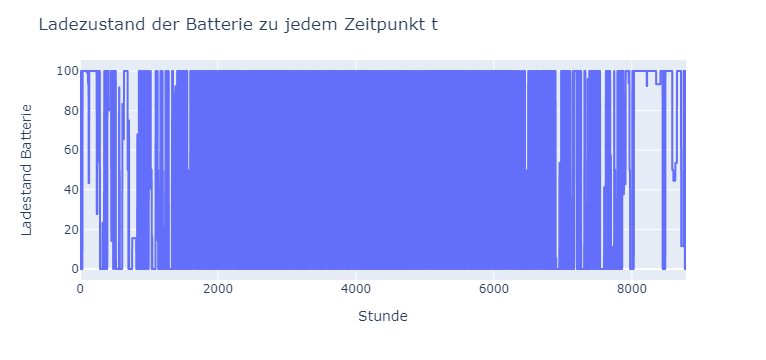

In [13]:
fig = px.line(dfm1, x=dfm1.index, y= dfm1["Ladestand Batterie"])
fig.update_layout(
    title="Ladezustand der Batterie zu jedem Zeitpunkt t",
    xaxis_title="Stunde")
    
fig.show()

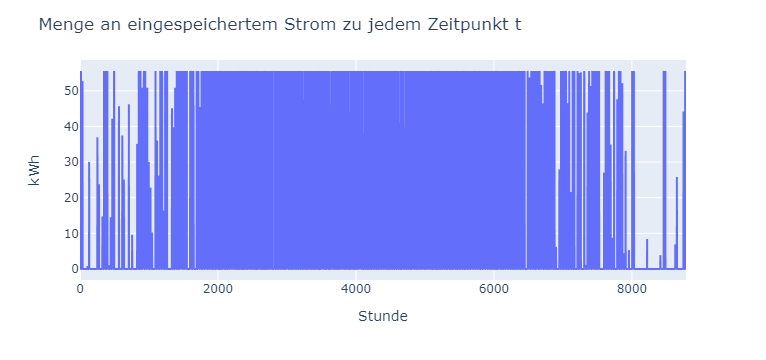

In [14]:
fig = px.line(dfm1, x=dfm1.index, y= dfm1["Batterie laden"])
fig.update_layout(
    title="Menge an eingespeichertem Strom zu jedem Zeitpunkt t",
    xaxis_title="Stunde", yaxis_title="kWh")
    
fig.show()

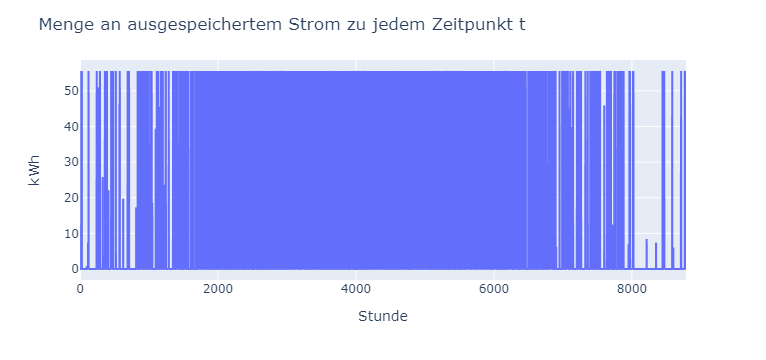

In [15]:
fig = px.line(dfm1, x=dfm1.index, y= dfm1["Batterie entladen"])
fig.update_layout(
    title="Menge an ausgespeichertem Strom zu jedem Zeitpunkt t",
    xaxis_title="Stunde", yaxis_title="kWh")
    
fig.show()

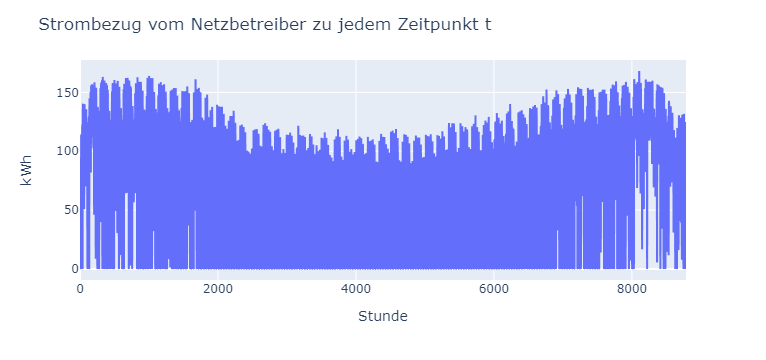

In [16]:
fig = px.line(dfm1, x=dfm1.index, y= dfm1["Strom ziehen"])
fig.update_layout(
    title="Strombezug vom Netzbetreiber zu jedem Zeitpunkt t",
    xaxis_title="Stunde", yaxis_title="kWh")
    
fig.show()

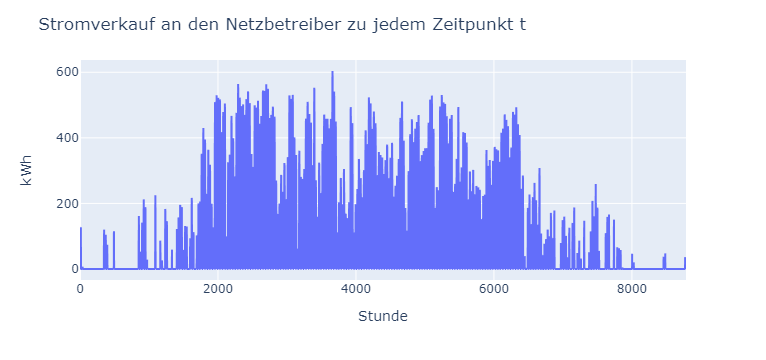

In [17]:
fig = px.line(dfm1, x=dfm1.index, y= dfm1["Strom einspeisen"])
fig.update_layout(
    title="Stromverkauf an den Netzbetreiber zu jedem Zeitpunkt t",
    xaxis_title="Stunde", yaxis_title="kWh")
    
fig.show()

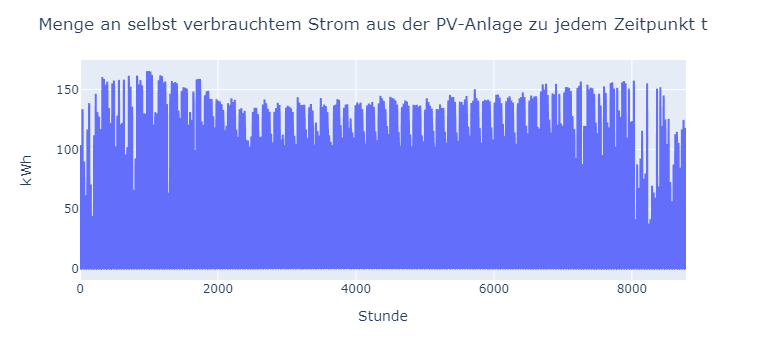

In [18]:
fig = px.line(dfm1, x=dfm1.index, y= dfm1["Eigenverbrauch"])
fig.update_layout(
    title="Menge an selbst verbrauchtem Strom aus der PV-Anlage zu jedem Zeitpunkt t",
    xaxis_title="Stunde", yaxis_title="kWh" )
    
fig.show()

### Eigenverbrauch gesmant

In [19]:
a1 = dfm1["Eigenverbrauch"].sum().round(3)
print(f" Eigenverbrauch gesamt 2020: {a1} kWh")

 Eigenverbrauch gesamt 2020: 424897.4 kWh


### Gesamt Eigenverbrauch aus der Batterie

In [20]:
b1 = dfm1["Batterie entladen"].sum().round(3)
print(f"Gesamt Eigenverbrauch aus der Batterie 2020: {b1} kWh")

Gesamt Eigenverbrauch aus der Batterie 2020: 32517.048 kWh


### Gesamtstromkosten des Standorts mit PV-Anlage und Batterie

In [21]:
print("Gesamtkosten:", m1.objVal)

Gesamtkosten: 109190.31955706644


### Ersparnis durch Eigenverbrauch gesamt

In [22]:
df_kosten["Gesamtkosten in EUR"] - dfm1["Eigenverbrauch"].sum() * 0.22

Datum (MEZ)
2020    136159.816496
Name: Gesamtkosten in EUR, dtype: float64

### Ersparnis durch Eigenverbrauch aus der Batterie

In [23]:
(dfm1["Batterie entladen"].sum() * stromkosten).round(3)

7153.751

## Aufgabe 2

<div>
<img src="Aufgabe2.png" width="750"/>
</div>

### Indexmengen
$t \in T $: Index für den Zeithorizont



### Parameter
$Last_{t}\in \mathbb{R}^+$: Strombedarf zum Zeitpunkt t in kWh.

$PV_{t}\in \mathbb{R}^+$: Produzierte Strommenge der PV-Anlage zum Zeitpunkt t.

$Stromkosten_{t} \in \mathbb{R}^+$: Strompreis zum Zeitpunkt t.

$Einspg_{t} = 4ct/kWh$: Gewinn für einspeisen des Stroms zum Zeitpunkt t.

$\text{Battlst}_{0} = 0kWh $: Anfangskapazität der Batterie beträgt 0kWh.

$\text{BattKap}_{max} = 100 kWh$: Maximale Speicherkapazität der Batterie zum Zeitpunkt t.

$\text{BattKap}_{min} = 0 kWh$: Minimale Speicherkapazität der Batterie zum Zeitpunkt t.

$\text{Batteff} = 0.9$: Die Batterie hat eine Energieeffizienz von 90%.





### Entscheidungsvariablen

${eigverb}_{t} \in \mathbb{R}^+$: Eigenverbrauch zum Zeitpunkt t in kWh.

${strein}_{t} \in \mathbb{R}^+$: Strommenge die ins Netz eingepseist wird zum Zeitpunkt t.

${strziehn}_{t} \in \mathbb{R}^+$: Strommenge die vom Netz bezogen wird zum Zeitpunkt t.

${battlst}_{t} \in \{0,...,100\}kWh$: Batteriezustand zum Zeitpunkt t.

${battentladen}_{t} \in \{0,...,50\}kWh$: Entladung der Batterie zum Zeitpunkt t in kWh.

${battladen}_{t} \in \{0,...,50\}kWh$: Beladung der Batterie zum Zeitpunkt t in kWh.

${battladenNetz}_{t} \in \{0,...,50\}kWh$: Beladung der Batterie aus dem Netz zum Zeitpunkt t in kWh.





### Zielfunktion

- **Gesamtkosten minimieren**.

\begin{equation}
\text{Min} \quad \sum_{t \in T} ((strziehn_{t} + battladenNetz_{t}) * stromkosten) - (strein_{t} * einspg)  
\end{equation}


### Nebenbedingungen

**Eigenverbrauch**: Eigenverbrauch zum Zeitpunkt t.
\begin{equation}
\text eigverb_{t} + strein_{t} + battladen_t{t} = pv_{t}
\tag{1}
\end{equation}


**Strombedarf**: Der Strombedarf muss zu jedem Zeitpunkt t zu 100% gedeckt werden.
\begin{equation}
\text eigverb_{t} + battentladen_{t} + stromziehn_{t} = Last_{t} \quad \forall t \in T
\tag{2}
\end{equation}


**Batterie be/entladen**: Die Summe der Lastströme der Batterie darf nicht größer als 50kWh sein.
\begin{equation}
\text battentladen_{t} + battladen_{t} \leq 50kWh \quad \forall t \in T
\tag{3}
\end{equation}

**Batteriestatus**: Batteriezustand muss diese Bedinung erfüllen, um laden bzw. entladen zu können.
\begin{equation} 
\text  0 \leq Battlst_{t} \leq 100 \quad \forall t \in T
\tag{4}
\end{equation}

**Batteriezustand t=0**: Batteriezustand zum Zeitpunkt 0 beträgt 0kWh.
\begin{equation}
\text  Battlst_{0} = 0 \quad t = 0
\tag{5}
\end{equation}

**Batteriezustand t**: Batteriezustand zum Zeitpunkt t.
\begin{equation}
\text  battlst_{t} + batteff * (battladenNetz_{t} + battladen_{t} - battentladen_{t}) = Battlst_{t+1} \quad \forall t \in T
\tag{6}
\end{equation}

In [24]:
m2 = gp.Model('Dynamischer Strompreis')

In [25]:
    # Paramter
    einspg = 0.04
    battKapmax = 100
    battKapmin = 0
    batteff = 0.9

    last = df["Last [kWh]"].values # Strombedarf zum Zeitpunkt t.
    pv = df["Solar [kWh]"].values # Produzierte Strommenge der PV-Anlage zum Zeitpunkt t.
    stromkosten = df["Preis [EUR/kWh]"].values
    zeit = range(0,8784) # Zeithorizont

    # Entscheidungsvariablen
    strein_t = m2.addVars(zeit, vtype=GRB.CONTINUOUS, name="Strom einspeisen", lb=0)
    strziehn_t = m2.addVars(zeit, vtype=GRB.CONTINUOUS, name="Strom ziehn", lb=0)
    battlst_t = m2.addVars(range(0,8785), vtype=GRB.CONTINUOUS, name = "Ladestand Batterie")
    battentladen_t = m2.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie entladen", lb=0)
    battladen_t = m2.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie laden", lb=0)
    eigverb_t = m2.addVars(zeit, vtype=GRB.CONTINUOUS, name="Eigenverbrauch", lb=0)
    battladenNetz_t = m2.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie laden Netz", lb=0)

    # Nebenbedingungen
    # Standort muss zu 100% versorgt werden
    last_const = m2.addConstrs(eigverb_t[t] + strziehn_t[t] + (batteff*battentladen_t[t]) == last[t]
                              for t in zeit)

    # Eigenverbrauch zum Zeitpunkt t
    eigenverb_const = m2.addConstrs(eigverb_t[t] + strein_t[t] + battladen_t[t] == pv[t] 
                                   for t in zeit)

    # Batteriezustand zum Zeitpunkt 0 beträgt 0kWh
    battzustand_const = m2.addConstr(battlst_t[zeit[0]] == battKapmin)

    # Batterieladestand darf nicht kleiner als 0kWh sein
    battkapmin_const = m2.addConstrs(battlst_t[t] >= battKapmin
                                    for t in zeit)

    # Maximaler Batterieladestand darf nicht größer 100kWh sein
    battkapmax_const = m2.addConstrs(battlst_t[t] <= battKapmax
                                    for t in zeit)

    # Batteriezustand zum Zeitpunkt t 
    battlst_t_const = m2.addConstrs(battlst_t[t] + batteff * (battladenNetz_t[t] + battladen_t[t] - battentladen_t[t]) == battlst_t[t+1] 
                                   for t in zeit)


    # Die Batterie  darf nur mit max 50kWh be bzw. entladen
    battbe_entladen_const = m2.addConstrs(batteff * (battentladen_t[t] + battladen_t[t] + battladenNetz_t[t]) <= 50
                                         for t in zeit)

    # Zielfunktion
    m2.setObjective(
        gp.quicksum(((((strziehn_t[t] + battladenNetz_t[t]) * stromkosten[t])) - (strein_t[t] * einspg) for t in zeit)



        ), GRB.MINIMIZE
    )


    m2.optimize()

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: AMD Ryzen 3 3250U with Radeon Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 52705 rows, 61489 columns and 140545 nonzeros
Model fingerprint: 0x1f2aba22
Coefficient statistics:
  Matrix range     [9e-01, 1e+00]
  Objective range  [5e-05, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-03, 7e+02]
Presolve removed 29621 rows and 25944 columns
Presolve time: 0.15s
Presolved: 23084 rows, 35545 columns, 71089 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.01s

Barrier statistics:
 AA' NZ     : 2.952e+04
 Factor NZ  : 2.453e+05 (roughly 26 MB of memory)
 Factor Ops : 3.749e+06 (less than 1 second per iteration)
 Threads    : 1

                  Objective                Residual
Iter       Primal          Dual         Primal    Dual     Compl     Time
   0  

In [26]:
dfm2 = pd.DataFrame()
for v in m2.getVars():
        name = v.varName
        zeit = int(v.varName[v.varName.index('[') + 1:v.varName.index(']')])
        if 'Strom einspeisen' in name:
            dfm2.loc[zeit, 'Strom einspeisen'] = v.x
        elif 'Strom ziehn' in name:
            dfm2.loc[zeit, 'Strom ziehen'] = v.x
        elif 'Ladestand Batterie' in name:
            dfm2.loc[zeit, 'Ladestand Batterie'] = v.X
        elif 'Batterie entladen' in name:
            dfm2.loc[zeit, 'Batterie entladen'] = v.x
        elif 'Batterie laden' in name:
            dfm2.loc[zeit, 'Batterie laden'] = v.x
        elif 'Eigenverbrauch' in name:
            dfm2.loc[zeit, 'Eigenverbrauch'] = v.x
        elif 'Batterie laden Netz' in name:
            dfm2.loc[zeit, 'Batterie laden Netz'] = v.x

dfmt = pd.DataFrame()
for v in m2.getVars():
        name = v.varName
        zeit = int(v.varName[v.varName.index('[') + 1:v.varName.index(']')])
        if 'Batterie laden Netz' in name:
            dfmt.loc[zeit, 'Batterie laden Netz'] = v.x
dfm2["Batterie laden Netz"] = dfmt["Batterie laden Netz"]

### Eigenverbrauch gesamt

In [27]:
print("Fester Strompreis:")
print(dfm1["Eigenverbrauch"].sum().round(3))
print("Dynamischer Strompreis:")
print(dfm2["Eigenverbrauch"].sum().round(3))

Fester Strompreis:
424897.4
Dynamischer Strompreis:
385197.114


### Gesamt Eigenverbrauch aus der Batterie

In [28]:
print("Fester Strompreis:")
print(dfm1["Batterie entladen"].sum().round(3))
print("Dynamischer Strompreis:")
print(dfm2["Batterie entladen"].sum().round(3))

Fester Strompreis:
32517.048
Dynamischer Strompreis:
80584.848


### Gesamtstromkosten des Standorts mit PV-Anlage und Batterie

In [29]:
print("Gesamtkosten Basismodell:", m1.objVal)
print("Gesamtkosten variable Strompreis:", m2.objVal)

Gesamtkosten Basismodell: 109190.31955706644
Gesamtkosten variable Strompreis: 69973.23100170113


### Ersparnis durch Eigenverbrauch gesamt

In [30]:
df_kostenD = df.groupby(df["Datum (MEZ)"].map(lambda x: x.year)).agg({"Last [kWh]" : "sum"})
df_kostenD["Gesamtkosten in EUR"] = df_kosten["Last [kWh]"] * df["Preis [EUR/kWh]"]
df_kostenD["Diff"] = (df_kosten["Last [kWh]"] - dfm2["Eigenverbrauch"]) * df["Preis [EUR/kWh]"]

In [31]:
print("Ersparnis durch Eigenverbrauch gesamt Model1:", df_kosten["Gesamtkosten in EUR"] - dfm1["Eigenverbrauch"].sum() * 0.22)
print("Ersparnis durch Eigenverbrauch gesamt Model2:", df_kostenD["Diff"])

Ersparnis durch Eigenverbrauch gesamt Model1: Datum (MEZ)
2020    136159.816496
Name: Gesamtkosten in EUR, dtype: float64
Ersparnis durch Eigenverbrauch gesamt Model2: Datum (MEZ)
2020    100518.484711
Name: Diff, dtype: float64


### Ersparnis durch Eigenverbrauch aus der Batterie

In [32]:
merged = pd.merge(df, dfm2, left_index=True, right_index=True)
merged["Ersparnis"] = merged["Batterie entladen"] * merged["Preis [EUR/kWh]"]
print(f"Ersparnis durch Eigenverbrauch aus der Batterie: {merged.Ersparnis.sum().round(3)}")

Ersparnis durch Eigenverbrauch aus der Batterie: 14937.148


### Vergleich typischer Situtationen

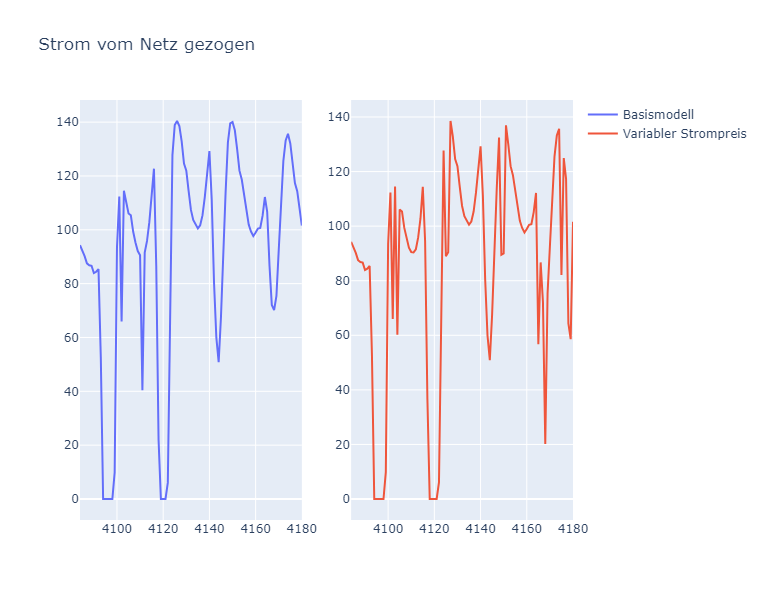

In [33]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go


fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Scatter(x=dfm1.index[4084:4181], y=dfm1["Strom ziehen"], name="Basismodell"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=dfm2.index[4084:4181], y=dfm2["Strom ziehen"], name="Variabler Strompreis"),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="Strom vom Netz gezogen")
fig.show()

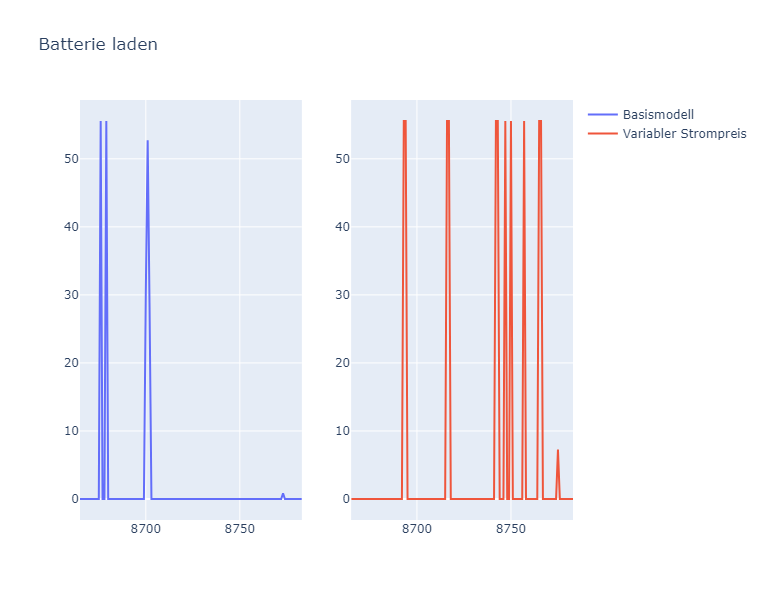

In [34]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Scatter(x=dfm1.index[8665:8784], y=dfm1["Batterie laden"], name="Basismodell"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=dfm2.index[8665:8784], y=dfm2["Batterie laden"], name="Variabler Strompreis"),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="Batterie laden")
fig.show()


## Aufgabe 3

In [35]:
battdictkap = {}
for k in range(0,1001,100):
    m3 = gp.Model("Dynamischer Speicher")
# Paramter
    einspg = 0.04
    battKapmax = k
    battKapmin = 0
    batteff = 0.9

    last = df["Last [kWh]"].values # Strombedarf zum Zeitpunkt t.
    pv = df["Solar [kWh]"].values # Produzierte Strommenge der PV-Anlage zum Zeitpunkt t.
    stromkosten = df["Preis [EUR/kWh]"].values
    zeit = range(0,8784) # Zeithorizont

    # Entscheidungsvariablen
    strein_t = m3.addVars(zeit, vtype=GRB.CONTINUOUS, name="Strom einspeisen", lb=0)
    strziehn_t = m3.addVars(zeit, vtype=GRB.CONTINUOUS, name="Strom ziehn", lb=0)
    battlst_t = m3.addVars(range(0,8785), vtype=GRB.CONTINUOUS, name = "Ladestand Batterie")
    battentladen_t = m3.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie entladen", lb=0)
    battladen_t = m3.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie laden", lb=0)
    eigverb_t = m3.addVars(zeit, vtype=GRB.CONTINUOUS, name="Eigenverbrauch", lb=0)
    battladenNetz_t = m3.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie laden Netz", lb=0)

    # Nebenbedingungen
    # Standort muss zu 100% versorgt werden
    last_const = m3.addConstrs(eigverb_t[t] + strziehn_t[t] + (batteff*battentladen_t[t]) == last[t]
                              for t in zeit)

    # Eigenverbrauch zum Zeitpunkt t
    eigenverb_const = m3.addConstrs(eigverb_t[t] + strein_t[t] + battladen_t[t] == pv[t] 
                                   for t in zeit)

    # Batteriezustand zum Zeitpunkt 0 beträgt 0kWh
    battzustand_const = m3.addConstr(battlst_t[zeit[0]] == battKapmin)

    # Batterieladestand darf nicht kleiner als 0kWh sein
    battkapmin_const = m3.addConstrs(battlst_t[t] >= battKapmin
                                    for t in zeit)

    # Maximaler Batterieladestand darf nicht größer 100kWh sein
    battkapmax_const = m3.addConstrs(battlst_t[t] <= battKapmax
                                    for t in zeit)

    # Batteriezustand zum Zeitpunkt t 
    battlst_t_const = m3.addConstrs(battlst_t[t] + batteff * (battladenNetz_t[t] + battladen_t[t] - battentladen_t[t]) == battlst_t[t+1] 
                                   for t in zeit)


    # Die Batterie  darf nur mit max 50kWh be bzw. entladen
    battbe_entladen_const = m3.addConstrs(batteff * (battentladen_t[t] + battladen_t[t] + battladenNetz_t[t]) <= 50
                                         for t in zeit)

    # Zielfunktion
    m3.setObjective(
        gp.quicksum(((((strziehn_t[t] +battladenNetz_t[t]) * stromkosten[t])) - (strein_t[t] * einspg) for t in zeit)



        ), GRB.MINIMIZE
    )

    m3.setParam("OutputFlag", False)
    m3.optimize()
    battdictkap[k] = m3.objVal
    

## Gesamtkosten je Batteriekapazität

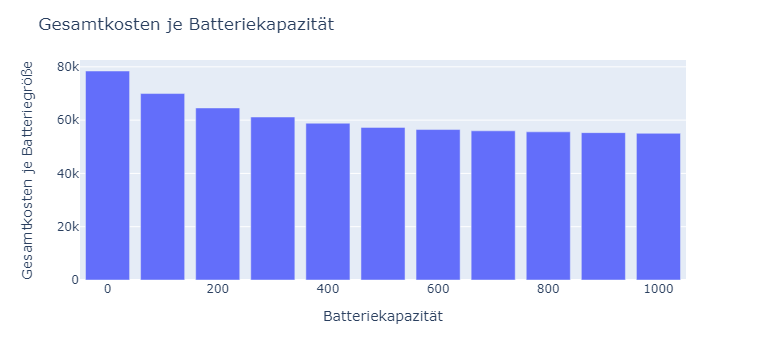

In [36]:
#battdictkap
gb = pd.DataFrame.from_dict(battdictkap, orient='index',
                       columns=['Gesamtkosten je Batteriegröße'])

fig = px.bar(gb, x= gb.index, y=gb["Gesamtkosten je Batteriegröße"])
fig.update_layout(
    title="Gesamtkosten je Batteriekapazität",
    xaxis_title="Batteriekapazität")
fig.show()

## Aufgabe 4

<div>
<img src="Aufgabe4.png" width="750"/>
</div>

### Indexmengen
$t \in T $: Index für den Zeithorizont



### Parameter
$Last_{t}\in \mathbb{R}^+$: Strombedarf zum Zeitpunkt t in kWh.

$PV_{t}\in \mathbb{R}^+$: Produzierte Strommenge der PV-Anlage zum Zeitpunkt t.

$Stromkosten_{t} \in \mathbb{R}^+$: Strompreis zum Zeitpunkt t.

$einspg_{t} = 0.04 $: Gewinn für einspeisen des Stroms zum Zeitpunkt t.

$einspgdy_{t} \in \mathbb{R}^+ - 0.05$: Gewinn für dynamisches einspeisen des Stroms zum Zeitpunkt t.

$\text{Battlst}_{0} = 0kWh $: Anfangskapazität der Batterie beträgt 0kWh.

$\text{BattKap}_{max} = 100 kWh$: Maximale Speicherkapazität der Batterie zum Zeitpunkt t.

$\text{BattKap}_{min} = 0 kWh$: Minimale Speicherkapazität der Batterie zum Zeitpunkt t.

$\text{Batteff} = 0.9$: Die Batterie hat eine Energieeffizienz von 90%.





### Entscheidungsvariablen

${eigverb}_{t} \in \mathbb{R}^+$: Eigenverbrauch zum Zeitpunkt t in kWh.

${strein}_{t} \in \mathbb{R}^+$: Strommenge die ins Netz eingepseist wird zum Zeitpunkt t.

${strziehn}_{t} \in \mathbb{R}^+$: Strommenge die vom Netz bezogen wird zum Zeitpunkt t.

${battlst}_{t} \in \{0,...,100\}kWh$: Batteriezustand zum Zeitpunkt t.

${battentladen}_{t} \in \{0,...,50\}kWh$: Entladung der Batterie zum Zeitpunkt t in kWh.

${battladen}_{t} \in \{0,...,50\}kWh$: Beladung der Batterie zum Zeitpunkt t in kWh.

${battladenNetz}_{t} \in \{0,...,50\}kWh$: Beladung der Batterie aus dem Netz zum Zeitpunkt t in kWh.

${battentladenNetz}_{t} \in \{0,...,50\}kWh$: Beladung der Batterie aus dem Netz zum Zeitpunkt t in kWh.

${dynamischein}_{t} \in \{0,1\}$: Entscheidung ob dynamisch eingespeist wird.

${statischein}_{t} \in \{0,1\}$: Entscheidung ob statisch eingespeist wird.






### Zielfunktion

- **Gesamtkosten minimieren**.

\begin{equation}
\text{Min} \quad \sum_{t \in T} ((strziehn_{t} + battladenNetz_{t}) * stromkosten) - (((strein_{t} + battentladenNetz_{t}) * dynamischein_{t} * (stromkosten - 0.05)) + (strein_{t} + battentladenNetz_{t}) * statischein_{t} * einsgp)
\end{equation}


### Nebenbedingungen

**Eigenverbrauch**: Eigenverbrauch zum Zeitpunkt t.
\begin{equation}
\text eigverb_{t} + strein_{t} + battladen_t{t} = pv_{t} \quad \forall t \in T
\tag{1}
\end{equation}


**Strombedarf**: Der Strombedarf muss zu jedem Zeitpunkt t zu 100% gedeckt werden.
\begin{equation}
\text eigverb_{t} + battentladen_{t} + stromziehn_{t} = Last_{t} \quad \forall t \in T
\tag{2}
\end{equation}


**Batterie be/entladen**: Die Summe der Lastströme der Batterie darf nicht größer als 50kWh sein.
\begin{equation}
\text battentladen_{t} + battladen_{t} + battentladenNetz_{t} + battladenNetz_{t} \leq 50kWh \quad \forall t \in T
\tag{3}
\end{equation}

**Batteriestatus**: Batteriezustand muss diese Bedinung erfüllen, um laden bzw. entladen zu können.
\begin{equation}
\text  0 \leq Battlst_{t} \leq 100 \quad \forall t \in T
\tag{4}
\end{equation}

**Batteriezustand t=0**: Batteriezustand zum Zeitpunkt 0 beträgt 0kWh.
\begin{equation}
\text  Battlst_{0} = 0 \quad t = 0
\tag{5}
\end{equation}

**Batteriezustand t**: Batteriezustand zum Zeitpunkt t.
\begin{equation}
\text  battlst_{t} + batteff * (battladenNetz_{t} + battladen_{t} - (battentladen_{t} + battentladenNetz_{t}) = Battlst_{t+1} \quad \forall t \in T
\tag{6}
\end{equation}

**Dynamisch einspeisen**: Stromenge aus Batterie und PV-Anlage muss min. 100kWh sein.
\begin{equation}
\text  strein_t{t} + battentladenNetz_t{t} >= 100 \quad \forall t \in T
\tag{7}
\end{equation}

**Binärvariablen**: Eine Binärvariable muss mind. 1 sein.
\begin{equation}
\text dynamischein_{t} + statischein_{t} = 1 \quad \forall t \in T
\tag{8}
\end{equation}

In [37]:
m4 = gp.Model("Dynamisches Einspeisen")

In [39]:
    # Paramter
    einspg = 0.04
    battKapmax = 100
    battKapmin = 0
    batteff = 0.9

    last = df["Last [kWh]"].values # Strombedarf zum Zeitpunkt t.
    pv = df["Solar [kWh]"].values # Produzierte Strommenge der PV-Anlage zum Zeitpunkt t.
    stromkosten = df["Preis [EUR/kWh]"].values
    zeit = range(0,8784) # Zeithorizont

    # Entscheidungsvariablen
    strein_t = m4.addVars(zeit, vtype=GRB.CONTINUOUS, name="Strom einspeisen", lb=0)
    strziehn_t = m4.addVars(zeit, vtype=GRB.CONTINUOUS, name="Strom ziehn", lb=0)
    battlst_t = m4.addVars(range(0,8785), vtype=GRB.CONTINUOUS, name = "Ladestand Batterie")
    battentladen_t = m4.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie entladen", lb=0)
    battladen_t = m4.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie laden", lb=0)
    eigverb_t = m4.addVars(zeit, vtype=GRB.CONTINUOUS, name="Eigenverbrauch", lb=0)
    battladenNetz_t = m4.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie laden Netz", lb=0)
    battentladenNetz_t = m4.addVars(zeit, vtype=GRB.CONTINUOUS, name="Batterie entladen Netz", lb=0)

    # Nebenbedingungen
    # Standort muss zu 100% versorgt werden
    last_const = m4.addConstrs(eigverb_t[t] + strziehn_t[t] + (batteff*battentladen_t[t]) == last[t]
                              for t in zeit)

    # Eigenverbrauch zum Zeitpunkt t
    eigenverb_const = m4.addConstrs(eigverb_t[t] + strein_t[t] + battladen_t[t] == pv[t] 
                                   for t in zeit)

    # Batteriezustand zum Zeitpunkt 0 beträgt 0kWh
    battzustand_const = m4.addConstr(battlst_t[zeit[0]] == battKapmin)

    # Batterieladestand darf nicht kleiner als 0kWh sein
    battkapmin_const = m4.addConstrs(battlst_t[t] >= battKapmin
                                    for t in zeit)

    # Maximaler Batterieladestand darf nicht größer 100kWh sein
    battkapmax_const = m4.addConstrs(battlst_t[t] <= battKapmax
                                    for t in zeit)

    # Batteriezustand zum Zeitpunkt t 
    battlst_t_const = m4.addConstrs(battlst_t[t] + batteff * (battladenNetz_t[t] + battladen_t[t] - battentladen_t[t]) == battlst_t[t+1] 
                                   for t in zeit)


    # Die Batterie  darf nur mit max 50kWh be bzw. entladen
    battbe_entladen_const = m4.addConstrs(batteff * (battentladen_t[t] + battladen_t[t] + battladenNetz_t[t] +  battentladenNetz_t[t]) <= 50
                                         for t in zeit)

    # Zielfunktion
    m4.setObjective(
        gp.quicksum((((strziehn_t[t] + battladenNetz_t[t]) * stromkosten[t]) - ((strein_t[t] + battentladenNetz_t[t]) * (stromkosten[t] - 0.05)) 
                                                                                  for t in zeit)



        ), GRB.MINIMIZE
    )


    m4.optimize()

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: AMD Ryzen 3 3250U with Radeon Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 105410 rows, 140546 columns and 298658 nonzeros
Model fingerprint: 0x48e6560b
Coefficient statistics:
  Matrix range     [9e-01, 1e+00]
  Objective range  [5e-05, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-03, 7e+02]
Presolve removed 64346 rows and 70181 columns
Presolve time: 0.27s
Presolved: 41064 rows, 70365 columns, 132800 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.01s

Barrier statistics:
 AA' NZ     : 4.796e+04
 Factor NZ  : 5.395e+05 (roughly 50 MB of memory)
 Factor Ops : 9.943e+06 (less than 1 second per iteration)
 Threads    : 1

                  Objective                Residual
Iter       Primal          Dual         Primal    Dual     Compl     Time
   

In [40]:
m4.obJVal

20057.586956348663

In [44]:
dfm4 = pd.DataFrame()
for v in m4.getVars():
        name = v.varName
        zeit = int(v.varName[v.varName.index('[') + 1:v.varName.index(']')])
        if 'Strom einspeisen' in name:
            dfm4.loc[zeit, 'Strom einspeisen'] = v.x
        elif 'Strom ziehn' in name:
            dfm4.loc[zeit, 'Strom ziehen'] = v.x
        elif 'Ladestand Batterie' in name:
            dfm4.loc[zeit, 'Ladestand Batterie'] = v.X
        elif 'Batterie entladen' in name:
            dfm4.loc[zeit, 'Batterie entladen'] = v.x
        elif 'Batterie laden' in name:
            dfm4.loc[zeit, 'Batterie laden'] = v.x
        elif 'Eigenverbrauch' in name:
            dfm4.loc[zeit, 'Eigenverbrauch'] = v.x
            
dfmt4 = pd.DataFrame()            
for v in m4.getVars():
        name = v.varName
        zeit = int(v.varName[v.varName.index('[') + 1:v.varName.index(']')])
        if 'Batterie laden Netz' in name:
            dfmt4.loc[zeit, 'Batterie laden Netz'] = v.x
        elif 'Batterie entladen Netz' in name:
            dfmt4.loc[zeit, 'Batterie entladen Netz'] = v.x

dfm4["Batterie laden Netz"] = dfmt4["Batterie laden Netz"]
dfm4["Batterie entladen Netz"] = dfmt4["Batterie entladen Netz"]

## Aufgabe 5

In [45]:
df2 = pd.read_pickle("energy_2020_scenarios.pkl")
df2

,Datum (MEZ),Preis Forecast,Index
0,2020-01-01 00:00:00+01:00,0.190400,0
1,2020-01-01 01:00:00+01:00,0.191737,0
2,2020-01-01 02:00:00+01:00,0.128795,0
3,2020-01-01 03:00:00+01:00,0.146671,0
4,2020-01-01 04:00:00+01:00,0.116782,0
...,...,...,...
8779,2020-12-31 19:00:00+01:00,0.133590,99
8780,2020-12-31 20:00:00+01:00,0.197942,99
8781,2020-12-31 21:00:00+01:00,0.158048,99
8782,2020-12-31 22:00:00+01:00,0.191907,99


In [46]:
dfm5 = pd.DataFrame()
for szenario in  range(0, 100):
        szenario_df = df2[df2["Index"] == szenario].copy()
        szenario_df['Stromkosten'] = ((szenario_df['Preis Forecast'] * dfm1['Strom ziehen'])
        - (dfm1["Strom einspeisen"] * 0.04))
        dfm5.loc[szenario, "Model1"] = szenario_df['Stromkosten'].sum()
for szenario in  range(0, 100):
        szenario_df = df2[df2["Index"] == szenario].copy()
        szenario_df['Stromkosten'] = (
            (szenario_df['Preis Forecast'] * (dfm2['Strom ziehen'] + dfm2["Batterie laden Netz"]))
        - (dfm2["Strom einspeisen"] * 0.04))
        dfm5.loc[szenario, "Model2"] = szenario_df['Stromkosten'].sum()
for szenario in  range(0, 100):
        szenario_df = df2[df2["Index"] == szenario].copy()
        szenario_df['Stromkosten'] = (
            (szenario_df['Preis Forecast'] * (dfm4['Strom ziehen'] + dfm4["Batterie laden Netz"]))
        - ((dfm4["Strom einspeisen"] + dfm4["Batterie entladen Netz"]) * (szenario_df['Preis Forecast']-0.05)))
        dfm5.loc[szenario, "Model4"] = szenario_df['Stromkosten'].sum()
dfm5

,Model1,Model2,Model4
0,78477.723256,69728.771739,19162.225681
1,79755.519163,70687.538629,21437.490598
2,77545.204691,68918.946147,18349.243438
3,78640.352315,70275.608831,18186.279285
4,78802.500263,70387.867767,21572.676563
...,...,...,...
95,79807.240167,70887.283203,20086.041075
96,76224.339019,67653.318306,21002.409472
97,80748.008503,72198.326695,17264.992432
98,80074.596078,71575.915524,19709.861554


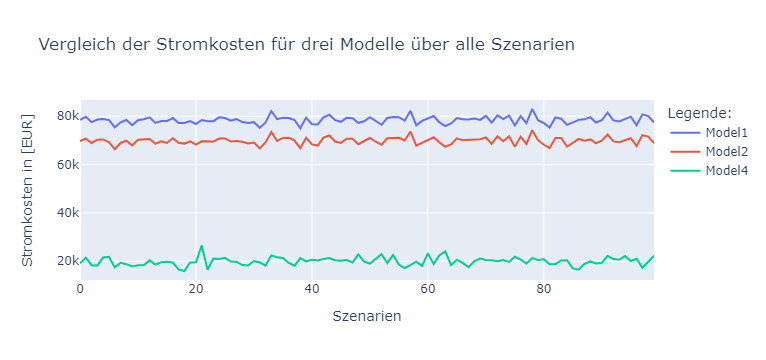

In [47]:
fig = px.line(dfm5, x=dfm5.index, y=['Model1', 'Model2', 'Model4'],
              labels={'index': 'Szenarien', 'value': 'Stromkosten in [EUR]'},
              title = 'Vergleich der Stromkosten für drei Modelle über alle Szenarien' )


fig.update_layout(legend_title="Legende:")
fig.show()